In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
from sklearn import tree
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import accuracy_score, confusion_matrix, ConfusionMatrixDisplay, classification_report

In [86]:
dados = pd.read_csv('credit_data.csv')

dados.describe()

,clientid,income,age,loan,default
count,2000.000000,2000.000000,1997.000000,2000.000000,2000.000000
mean,1000.500000,45331.600018,40.807559,4444.369695,0.141500
std,577.494589,14326.327119,13.624469,3045.410024,0.348624
min,1.000000,20014.489470,-52.423280,1.377630,0.000000
25%,500.750000,32796.459717,28.990415,1939.708847,0.000000
50%,1000.500000,45789.117313,41.317159,3974.719419,0.000000
75%,1500.250000,57791.281668,52.587040,6432.410625,0.000000
max,2000.000000,69995.685578,63.971796,13766.051239,1.000000


In [7]:
np.unique(dados.default, return_counts=True)

(array([0, 1], dtype=int64), array([1717,  283], dtype=int64))

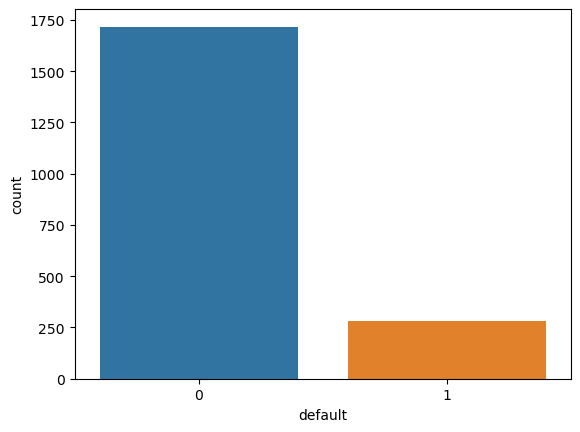

In [8]:
sns.countplot(x=dados.default);

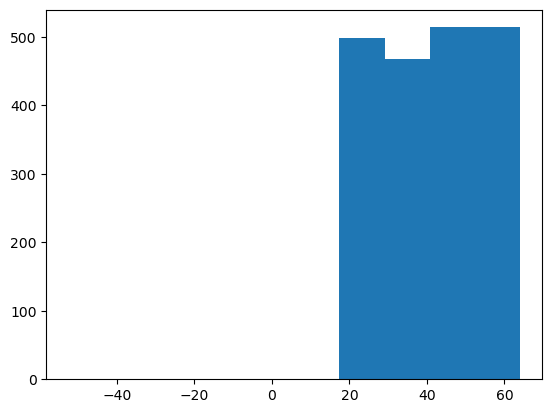

In [9]:
plt.hist(x = dados.age);

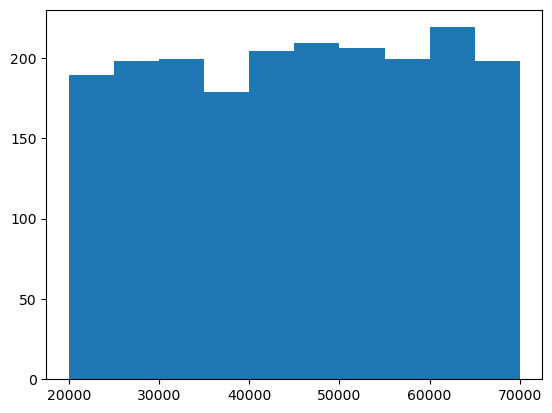

In [10]:
plt.hist(x=dados.income);

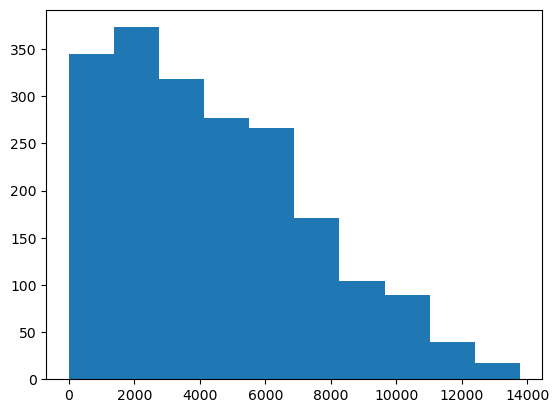

In [9]:
plt.hist(x=dados.loan);

In [10]:
px_grafico = px.scatter_matrix(dados, dimensions=['age', 'income', 'loan'], color='default')
px_grafico.show()

C:\Users\santo\anaconda3\lib\site-packages\plotly\express\_core.py:279: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  dims = [


In [11]:
dados.loc[dados['age'] < 0 , 'age'] = 42.92

In [89]:
dados.isna().sum()

clientid    0
income      0
age         0
loan        0
default     0
dtype: int64

In [88]:
dados.age.fillna(dados.age.mean(), inplace=True)
dados.isna().sum()

clientid    0
income      0
age         0
loan        0
default     0
dtype: int64

In [90]:
x_dados = dados.iloc[:, 1:4].values
y_dados = dados.iloc[:, 4].values

In [92]:
from sklearn.preprocessing  import StandardScaler
scaler_sklearn = StandardScaler()
x_dados = scaler_sklearn.fit_transform(x_dados)
x_dados

array([[ 1.45393393,  1.33786439,  1.20281942],
       [-0.76217555,  0.53704215,  0.69642695],
       [ 0.83682073,  1.63843621,  1.17471147],
       ...,
       [-0.07122592, -0.93972115,  0.35420081],
       [-0.11000289,  1.7018964 , -0.92675625],
       [ 1.682986  ,  1.1274146 ,  0.96381038]])

In [15]:
dados_census = pd.read_csv('census.csv')

<Axes: xlabel='income', ylabel='count'>

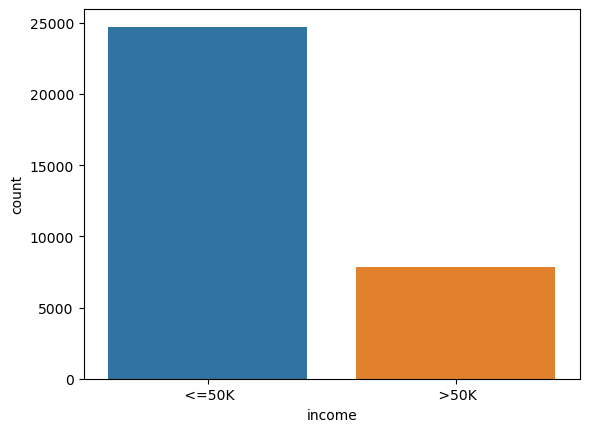

In [16]:
sns.countplot(x = dados_census.income)

(array([5570., 5890., 6048., 6163., 3967., 2591., 1595.,  496.,  174.,
          67.]),
 array([17. , 24.3, 31.6, 38.9, 46.2, 53.5, 60.8, 68.1, 75.4, 82.7, 90. ]),
 <BarContainer object of 10 artists>)

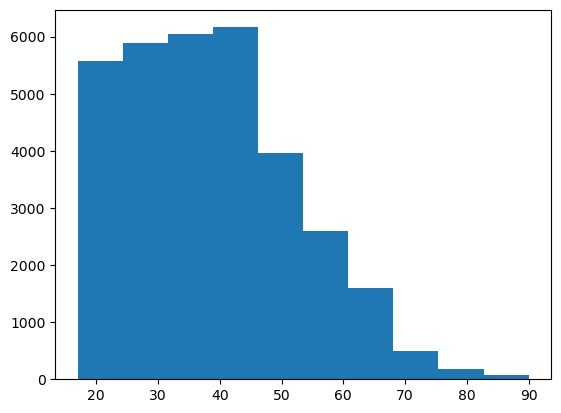

In [17]:
plt.hist(x = dados_census.age)

(array([  219.,   333.,  1160.,   933.,  1608., 10501.,  8673.,  1067.,
         7078.,   989.]),
 array([ 1. ,  2.5,  4. ,  5.5,  7. ,  8.5, 10. , 11.5, 13. , 14.5, 16. ]),
 <BarContainer object of 10 artists>)

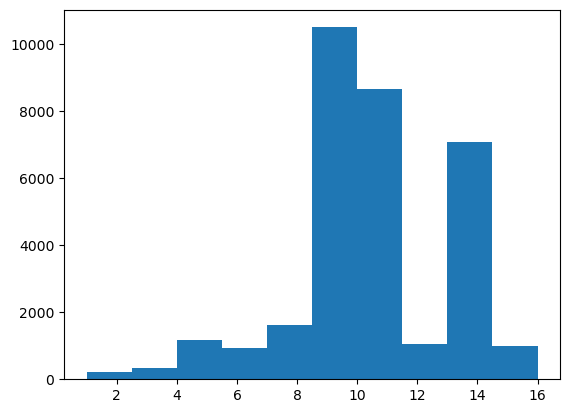

In [32]:
plt.hist(x = dados_census['education-num'])

(array([  736.,  2192.,  2317., 17735.,  3119.,  3877.,  1796.,   448.,
          202.,   139.]),
 array([ 1. , 10.8, 20.6, 30.4, 40.2, 50. , 59.8, 69.6, 79.4, 89.2, 99. ]),
 <BarContainer object of 10 artists>)

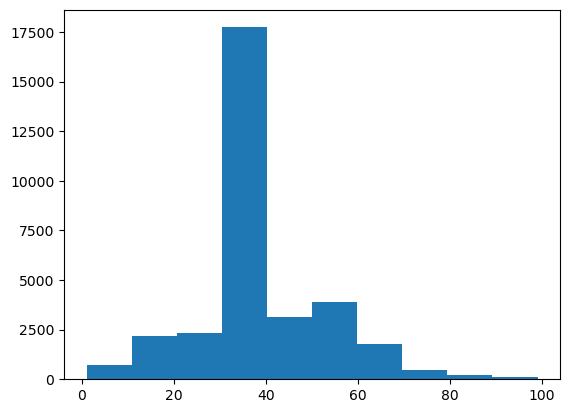

In [33]:
plt.hist(x = dados_census['hour-per-week'])

In [18]:
grafico = px.treemap(dados_census, path=['workclass', 'age'])
grafico.show()

In [19]:
grafico = px.treemap(dados_census, path=['occupation', 'relationship', 'age'])
grafico.show()

In [20]:
grafico = px.parallel_categories(dados_census, dimensions=['occupation', 'relationship'])
grafico.show()

C:\Users\santo\anaconda3\lib\site-packages\plotly\express\_core.py:279: FutureWarning:

iteritems is deprecated and will be removed in a future version. Use .items instead.



In [21]:
grafico = px.parallel_categories(dados_census, dimensions=['workclass','occupation', 'income'])
grafico.show()

C:\Users\santo\anaconda3\lib\site-packages\plotly\express\_core.py:279: FutureWarning:

iteritems is deprecated and will be removed in a future version. Use .items instead.



In [22]:
grafico = px.parallel_categories(dados_census, dimensions=['education','income'])
grafico.show()

C:\Users\santo\anaconda3\lib\site-packages\plotly\express\_core.py:279: FutureWarning:

iteritems is deprecated and will be removed in a future version. Use .items instead.



In [23]:
x_census = dados_census.iloc[:, 0:14].values
y_census = dados_census.iloc[:, 14].values

In [26]:
from sklearn.preprocessing import LabelEncoder

label_encoder_workclass = LabelEncoder()
label_encoder_education = LabelEncoder()
label_encoder_marital = LabelEncoder()
label_encoder_occupation = LabelEncoder()
label_encoder_relationship = LabelEncoder()
label_encoder_race = LabelEncoder()
label_encoder_sex = LabelEncoder()
label_encoder_country = LabelEncoder()

In [27]:
x_census[:,1] = label_encoder_workclass.fit_transform(x_census[:,1])
x_census[:,3] = label_encoder_education.fit_transform(x_census[:,3])
x_census[:,5] = label_encoder_marital.fit_transform(x_census[:,5])
x_census[:,6] = label_encoder_occupation.fit_transform(x_census[:,6])
x_census[:,7] = label_encoder_relationship.fit_transform(x_census[:,7])
x_census[:,8] = label_encoder_race.fit_transform(x_census[:,8])
x_census[:,9] = label_encoder_sex.fit_transform(x_census[:,9])
x_census[:,13] = label_encoder_country.fit_transform(x_census[:,13])
x_census

array([[39, 7, 77516, ..., 0, 40, 39],
       [50, 6, 83311, ..., 0, 13, 39],
       [38, 4, 215646, ..., 0, 40, 39],
       ...,
       [58, 4, 151910, ..., 0, 40, 39],
       [22, 4, 201490, ..., 0, 20, 39],
       [52, 5, 287927, ..., 0, 40, 39]], dtype=object)

In [28]:
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer

In [29]:
onehotencoder_census = ColumnTransformer(transformers=[('OneHot', OneHotEncoder(), [1,3,5,6,7,8,9,13])], remainder='passthrough')

In [30]:
x_census = onehotencoder_census.fit_transform(x_census).toarray()
x_census

array([[0.0000e+00, 0.0000e+00, 0.0000e+00, ..., 2.1740e+03, 0.0000e+00,
        4.0000e+01],
       [0.0000e+00, 0.0000e+00, 0.0000e+00, ..., 0.0000e+00, 0.0000e+00,
        1.3000e+01],
       [0.0000e+00, 0.0000e+00, 0.0000e+00, ..., 0.0000e+00, 0.0000e+00,
        4.0000e+01],
       ...,
       [0.0000e+00, 0.0000e+00, 0.0000e+00, ..., 0.0000e+00, 0.0000e+00,
        4.0000e+01],
       [0.0000e+00, 0.0000e+00, 0.0000e+00, ..., 0.0000e+00, 0.0000e+00,
        2.0000e+01],
       [0.0000e+00, 0.0000e+00, 0.0000e+00, ..., 1.5024e+04, 0.0000e+00,
        4.0000e+01]])

In [31]:
from sklearn.preprocessing import StandardScaler
scaler_census = StandardScaler()
x_census = scaler_census.fit_transform(x_census)

x_census[0]

array([-0.2444502 , -0.17429511, -0.26209736, -0.01466381, -1.5167923 ,
       -0.18838933, -0.29093568,  4.90769968, -0.02073999, -0.17175325,
       -0.19348662, -0.11609195, -0.07201601, -0.10164955, -0.1422718 ,
       -0.12664495, -0.18406376, -0.21053433,  2.25399324, -0.11334387,
       -0.68994199, -0.23637391, -0.03960742, -0.13419553, -0.53714425,
       -0.39750806, -0.02658695, -0.92284068, -0.11403678,  1.43105786,
       -0.1802846 , -0.17735813, -0.24494366,  2.76348874, -0.01662771,
       -0.37949517, -0.37774555, -0.17745022, -0.20957797, -0.25595432,
       -0.33554133, -0.06780164, -0.38166338, -0.14260848, -0.35531609,
       -0.17127887, -0.22710355, -0.82533335,  1.70899099, -0.17624972,
       -0.42934582, -0.34403232, -0.22492681, -0.09820087, -0.18155194,
       -0.32576824, -0.09161163,  0.4130197 , -0.70307135,  0.70307135,
       -0.13502327, -0.02416321, -0.06107342, -0.0480488 , -0.04260602,
       -0.05409379, -0.04641598, -0.02933708, -0.05714946, -0.05

In [32]:
from sklearn.model_selection import train_test_split

In [93]:
X_credit_treinamento, X_credit_teste, y_credit_treinamento, y_credit_teste = train_test_split(x_dados, y_dados, test_size = 0.25, random_state = 0)

In [94]:
X_credit_treinamento.shape, y_credit_treinamento.shape

((1500, 3), (1500,))

In [95]:
X_census_treinamento, X_census_teste, y_census_treinamento, y_census_teste = train_test_split(x_census, y_census, test_size = 0.15, random_state = 0)

NameError: name 'x_census' is not defined

In [36]:
X_census_teste.shape, y_census_teste.shape

((4885, 108), (4885,))

In [37]:
import pickle

In [96]:
with open('credit.pkl', mode='wb') as f:
    pickle.dump([X_credit_treinamento, X_credit_teste, y_credit_treinamento, y_credit_teste], f)

In [39]:
with open('census.pkl', mode = 'wb') as f:
  pickle.dump([X_census_treinamento, y_census_treinamento, X_census_teste, y_census_teste], f)

In [28]:
base_risco_credito = pd.read_csv('risco_credito.csv')
base_risco_credito.describe()

,historia,divida,garantias,renda,risco
count,14,14,14,14,14
unique,3,2,2,3,3
top,desconhecida,alta,nenhuma,acima_35,alto
freq,5,7,11,7,6


In [29]:
X_base_risco_credito = base_risco_credito.iloc[:, 0:4].values
y_base_risco_credito = base_risco_credito.iloc[:, 4].values
X_base_risco_credito.shape

(14, 4)

In [32]:
from sklearn.preprocessing import LabelEncoder

label_enc = LabelEncoder()

X_base_risco_credito[:,0] = label_enc.fit_transform(X_base_risco_credito[:,0])
X_base_risco_credito[:,1] = label_enc.fit_transform(X_base_risco_credito[:,1])
X_base_risco_credito[:,2] = label_enc.fit_transform(X_base_risco_credito[:,2])
X_base_risco_credito[:,3] = label_enc.fit_transform(X_base_risco_credito[:,3])
X_base_risco_credito


array([[2, 0, 1, 0],
       [1, 0, 1, 1],
       [1, 1, 1, 1],
       [1, 1, 1, 2],
       [1, 1, 1, 2],
       [1, 1, 0, 2],
       [2, 1, 1, 0],
       [2, 1, 0, 2],
       [0, 1, 1, 2],
       [0, 0, 0, 2],
       [0, 0, 1, 0],
       [0, 0, 1, 1],
       [0, 0, 1, 2],
       [2, 0, 1, 1]], dtype=object)

In [33]:
import pickle
with open('risco_credito.pkl', mode='wb') as f:
    pickle.dump([X_base_risco_credito, y_base_risco_credito], f)

In [165]:
naive_risco_credito = GaussianNB()

X_base_risco_credito_train, X_base_risco_credito_test, y_base_risco_credito_train, y_base_risco_credito_test = train_test_split(X_base_risco_credito, y_base_risco_credito, test_size=0.5, random_state=140)

In [166]:
X_base_risco_credito_train, X_base_risco_credito_test

(array([[1, 1, 1, 2],
        [0, 0, 0, 2],
        [2, 0, 1, 0],
        [0, 0, 1, 2],
        [2, 1, 0, 2],
        [2, 1, 1, 0],
        [0, 1, 1, 2]], dtype=object),
 array([[2, 0, 1, 1],
        [1, 1, 1, 1],
        [1, 1, 0, 2],
        [1, 1, 1, 2],
        [0, 0, 1, 0],
        [1, 0, 1, 1],
        [0, 0, 1, 1]], dtype=object))

In [167]:
previsao = naive_risco_credito.fit(X_base_risco_credito_train, y_base_risco_credito_train).predict(X_base_risco_credito_test)
# X_base_risco_credito_test[4] = previsao
X_base_risco_credito_test, previsao

(array([[2, 0, 1, 1],
        [1, 1, 1, 1],
        [1, 1, 0, 2],
        [1, 1, 1, 2],
        [0, 0, 1, 0],
        [1, 0, 1, 1],
        [0, 0, 1, 1]], dtype=object),
 array(['alto', 'alto', 'moderado', 'alto', 'alto', 'alto', 'alto'],
       dtype='<U8'))

In [29]:
import pickle
with open('credit.pkl', 'rb') as f:
  X_credit_treinamento, X_credit_teste, y_credit_treinamento, y_credit_teste = pickle.load(f)

In [30]:
X_credit_teste.shape, y_credit_teste.shape

((500, 3), (500,))

In [65]:
naive_credit = GaussianNB()

In [66]:
previsao = naive_credit.fit(X_credit_treinamento, y_credit_treinamento).predict(X_credit_teste)

In [67]:
previsao

array([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0,
       0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0,
       0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0,
       0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0,
       0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0,

In [36]:
y_credit_teste

array([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0,
       0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0,
       0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1,
       0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0,
       0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0,

In [38]:
accuracy_score(y_credit_teste, previsao)

0.938

In [44]:
cm = confusion_matrix(y_credit_teste, previsao)

In [49]:
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=naive_census.classes_)

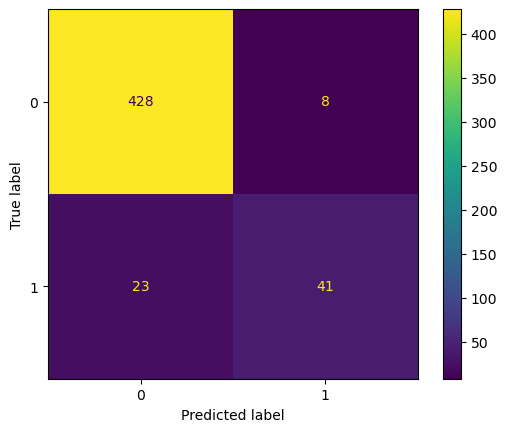

In [51]:
disp.plot();

In [60]:
print(classification_report(y_credit_teste, previsao))

              precision    recall  f1-score   support

           0       0.95      0.98      0.97       436
           1       0.84      0.64      0.73        64

    accuracy                           0.94       500
   macro avg       0.89      0.81      0.85       500
weighted avg       0.93      0.94      0.93       500



In [69]:
with open('census.pkl', 'rb') as f:
  X_census_treinamento, y_census_treinamento, X_census_teste, y_census_teste = pickle.load(f)

In [70]:
X_census_treinamento.shape, y_census_treinamento.shape

((27676, 108), (27676,))

In [71]:
naive_census = GaussianNB()

In [72]:
previsao = naive_census.fit(X_census_treinamento, y_census_treinamento).predict(X_census_teste)

In [73]:
previsao

array([' >50K', ' >50K', ' >50K', ..., ' <=50K', ' >50K', ' >50K'],
      dtype='<U6')

In [74]:
accuracy_score(y_census_teste, previsao)

0.4767656090071648

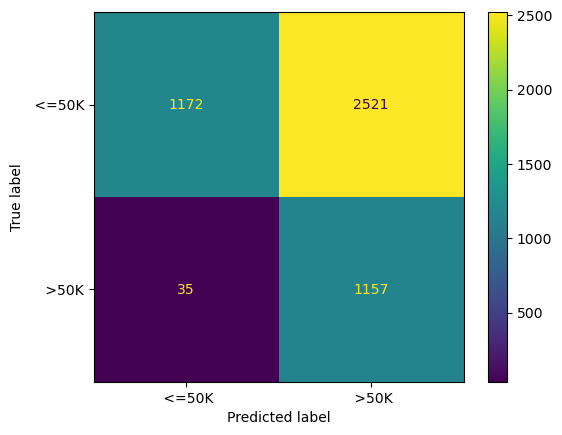

In [75]:
cm = confusion_matrix(y_census_teste, previsao)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=naive_census.classes_)
disp.plot();

In [36]:
import pickle
with open('risco_credito.pkl', 'rb') as f:
  X_risco_credito, y_risco_credito = pickle.load(f)

In [37]:
X_risco_credito

array([[2, 0, 1, 0],
       [1, 0, 1, 1],
       [1, 1, 1, 1],
       [1, 1, 1, 2],
       [1, 1, 1, 2],
       [1, 1, 0, 2],
       [2, 1, 1, 0],
       [2, 1, 0, 2],
       [0, 1, 1, 2],
       [0, 0, 0, 2],
       [0, 0, 1, 0],
       [0, 0, 1, 1],
       [0, 0, 1, 2],
       [2, 0, 1, 1]], dtype=object)

In [40]:
arvore_risco_credito = tree.DecisionTreeClassifier(criterion='entropy')
arvore_risco_credito = arvore_risco_credito.fit(X_risco_credito, y_risco_credito)

In [42]:
arvore_risco_credito.feature_importances_

array([0.41391643, 0.06408636, 0.03885431, 0.4831429 ])

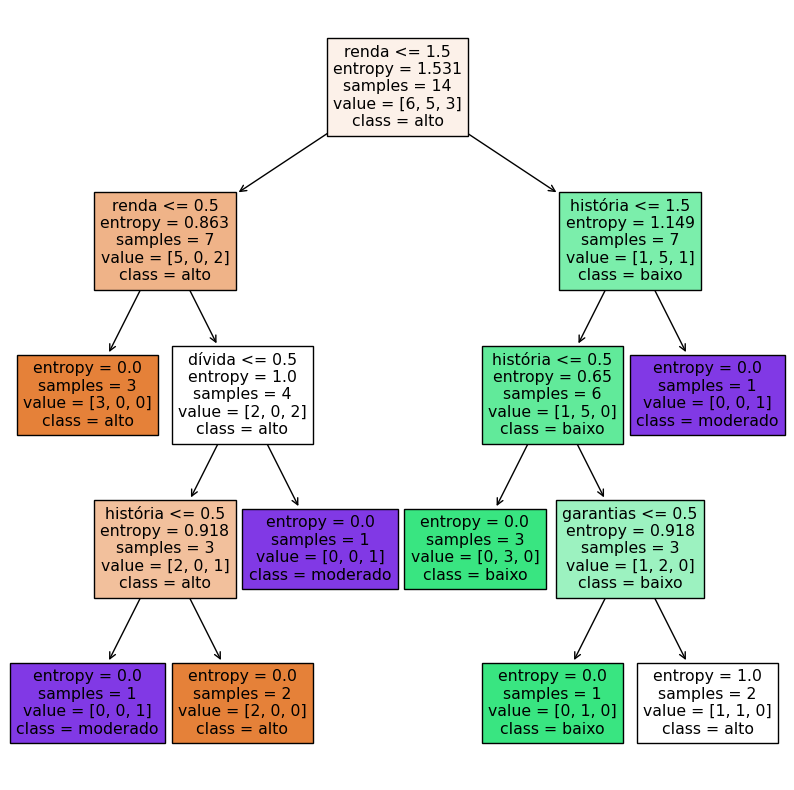

In [48]:

previsores = ['história', 'dívida', 'garantias', 'renda']
fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (10,10))
tree.plot_tree(arvore_risco_credito, feature_names=previsores, class_names=arvore_risco_credito.classes_, filled=True);

In [49]:
arvore_risco_credito.predict([[0,0,1,2],[2,0,0,0]])

array(['baixo', 'alto'], dtype=object)

In [97]:
import pickle
with open('credit.pkl', 'rb') as f:
  X_credit_treinamento, X_credit_teste, y_credit_treinamento, y_credit_teste = pickle.load(f)

In [98]:
X_credit_treinamento.shape, y_credit_treinamento.shape

((1500, 3), (1500,))

In [99]:
arvore_credito = tree.DecisionTreeClassifier(criterion='entropy', random_state=0)
arvore_credito = arvore_credito.fit(X_credit_treinamento, y_credit_treinamento)

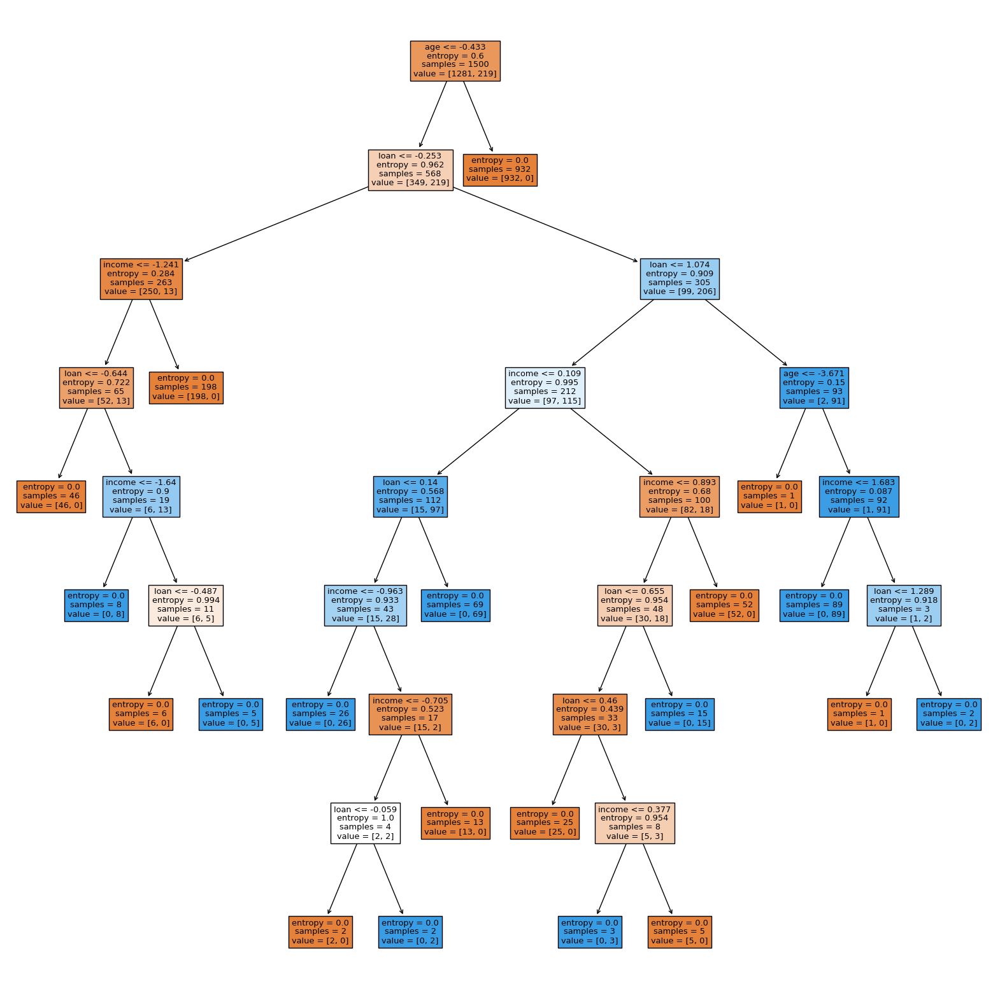

In [100]:
previsores = ['income', 'age', 'loan']
fig, axes = plt.subplots(nrows = 1, ncols = 1, figsize = (20,20))
tree.plot_tree(arvore_credito, feature_names=previsores, filled=True);

In [101]:
previsao = arvore_credito.predict(X_credit_teste)
previsao

array([1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0,
       0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0,
       0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0,
       0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0,
       0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0,

In [102]:
accuracy_score(y_credit_teste, previsao)

0.988

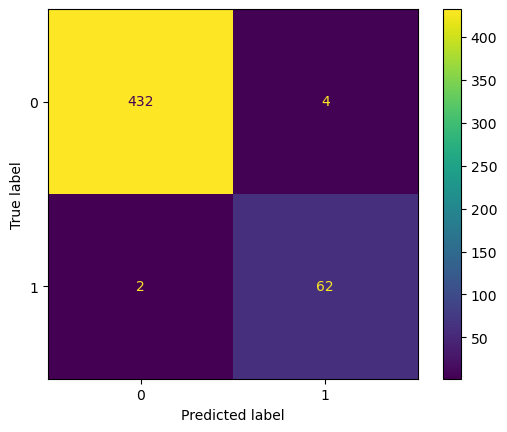

In [104]:
cm = confusion_matrix(y_credit_teste, previsao)
disp = ConfusionMatrixDisplay(confusion_matrix= cm)
disp.plot();

In [83]:
print(classification_report(y_credit_teste, previsao))

              precision    recall  f1-score   support

           0       0.99      0.99      0.99       436
           1       0.91      0.95      0.93        64

    accuracy                           0.98       500
   macro avg       0.95      0.97      0.96       500
weighted avg       0.98      0.98      0.98       500



In [3]:
import pickle
with open('census.pkl', 'rb') as f:  
  X_census_treinamento, y_census_treinamento, X_census_teste, y_census_teste = pickle.load(f)

In [4]:
arvore_censu = tree.DecisionTreeClassifier(criterion='entropy', random_state=0)
previsao = arvore_censu.fit(X_census_treinamento, y_census_treinamento).predict(X_census_teste)

In [9]:
previsao

array([' <=50K', ' <=50K', ' <=50K', ..., ' <=50K', ' <=50K', ' >50K'],
      dtype=object)

In [14]:
accuracy_score(y_census_teste, previsao)

0.8104401228249745

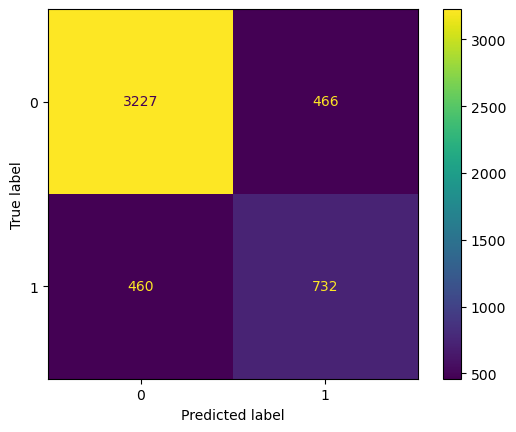

In [16]:
cm = confusion_matrix(y_census_teste, previsao)
disp = ConfusionMatrixDisplay(confusion_matrix= cm)
disp.plot();

In [18]:
print(classification_report(y_census_teste, previsao))

              precision    recall  f1-score   support

       <=50K       0.88      0.87      0.87      3693
        >50K       0.61      0.61      0.61      1192

    accuracy                           0.81      4885
   macro avg       0.74      0.74      0.74      4885
weighted avg       0.81      0.81      0.81      4885

